In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import montage
from skimage.morphology import disk, erosion
from skimage.measure import regionprops, regionprops_table, label
from numpy.matlib import repmat
import pandas as pd

In [11]:
size=1024
path = './Eindhoven_Flower_DataSet_2021/Marsh Lousewort/Marsh Lousewort_B4A5292.JPG'
img_p= cv2.imread(path)
img = cv2.resize(img_p, (size,size))

In [3]:
def empty(a):
    pass


cv2.namedWindow("TrackBars")
cv2.resizeWindow("TrackBars", 640,240)
cv2.createTrackbar("Hue Min", "TrackBars",0,179,empty)
cv2.createTrackbar("Hue Max", "TrackBars",179,179,empty)
cv2.createTrackbar("Sat Min", "TrackBars",0,255,empty)
cv2.createTrackbar("Sat Max", "TrackBars",255,255,empty)
cv2.createTrackbar("Val Min", "TrackBars",0,255,empty)
cv2.createTrackbar("Val Max", "TrackBars",255,255,empty)

while True:
    #img= cv2.imread(im)
    imgHSV = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    h_min = cv2.getTrackbarPos("Hue Min", "TrackBars")
    h_max = cv2.getTrackbarPos("Hue Max", "TrackBars")
    s_min = cv2.getTrackbarPos("Sat Min", "TrackBars")
    s_max = cv2.getTrackbarPos("Sat Max", "TrackBars")
    val_min = cv2.getTrackbarPos("Val Min", "TrackBars")
    val_max = cv2.getTrackbarPos("Val Max", "TrackBars")
    lower=np.array([h_min,s_min,val_min])
    upper = np.array([h_max,s_max,val_max])
    mask = cv2.inRange(imgHSV,lower,upper)
    imgResult = cv2.bitwise_and(img,img,mask=mask)


    cv2.imshow("Original",img)
    cv2.imshow("Result",imgResult)
    
        
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
        
#destroys all window
cv2.destroyAllWindows()

In [4]:
# show upper and lower HSV values
print(f"Image filtered in HSV between {lower} and {upper}.")

Image filtered in HSV between [115  51   0] and [179 116 255].


In [5]:
def Get_flower_data (img_file, radius, h, minArea, maxArea, mindist, h_min, s_min, v_min, h_max, s_max, v_max):
    
    filename = img_file
    image = imread(filename)
    (imHeight,imWidth,imDepth) = image.shape
    image_copy = image
    
    lower = np.array([h_min, s_min, v_min])
    upper = np.array([h_max, s_max, v_max])
    hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv_img, lower, upper)
    
    # figure
    plt.figure(figsize=(20,40))
    plt.imshow(mask, cmap=plt.cm.gray)
    plt.title('White pixels')  
    
    radius = radius; #% THIS PARAMETER MAY BE TUNED FOR I-PHONE VS DRONE IMAGES
    SE = disk(radius, dtype=np.uint8)
    labeledWhite = label(mask)
    statsWhite = regionprops(labeledWhite)
    
    statsWhiteTable = regionprops_table(labeledWhite, properties=('area', 'centroid'))
    df_statsWhite = pd.DataFrame.from_dict(statsWhiteTable)
    histEdges = range(1,200)
    df_statsWhite['color'] = repmat("white", len(statsWhite), 1)
    statsAll =  pd.concat([df_statsWhite])
    
    discarded = 0
    h = h;         #% THIS PARAMETER DETERMINES SIZE OF SMALL IMAGES (64 x 64)
    minArea = minArea;    #% Minimum area of colored pixels TUNE THIS PARAMETER
    maxArea = maxArea; #% To remove the large white disks
    mindist = mindist;   #% Minimum distance between two flowers TUNE THIS PARAMETER
    whiteFlowerImages = list()
    nrWhiteFlowers = 0;
    sortedAll = statsAll.sort_values(by=['area'],axis=0,ascending=False); #% Sort the areas on area size
    imageMask = np.zeros((imHeight,imWidth), np.bool8); #% Black image of same size as original image
    
    # figure    
    plt.figure(figsize=(20,40))
    plt.imshow(image)
          
    for index, row in sortedAll.iterrows():
        y = int(row['centroid-1']); #% 1 <= y <= imWidth
        x = int(row['centroid-0']); #% 1 <= x <= imHeight
        area = row['area']
        color = row['color']
        if (x > h) & (y > h) & (x < (imHeight - h)) & (y < (imWidth - h)) & (area >= minArea) & (area <= maxArea):
            # % Possible flower detected
            # % fprintf('Possible flower at x = %d, y = %d, mask = %s\n',x,y,mat2str(imageMask(x,y)))
                if imageMask[x][y] == False:
                # % Flower detected
                # % Create white circle in mask image of radius mindist
                    for i in range(x-mindist,x+mindist):
                        for j in range(y-mindist,y+mindist):
                            if ((i-x)**2 + (j-y)**2) <= mindist**2:
                                    imageMask[i][j] = True;

                    if color == "white":
                    # % Place area size in original image
                        plt.text(y+10,x, s=str(area),color='white')
                        nrWhiteFlowers = nrWhiteFlowers + 1
                        whiteFlowerImages.append(image[x-h:x+h,y-h:y+h,:])
                else:
                    discarded += 1
        else:
            discarded += 1
                    
    #Show the series of detected flowers/objects
    whiteFlowerImagesArray = np.array(whiteFlowerImages)
    allWhiteFlowers = montage(whiteFlowerImagesArray, multichannel=True)
    plt.figure(figsize=(40,40))
    plt.imshow(allWhiteFlowers)
    plt.title(print('Number of white flowers %d',nrWhiteFlowers))       
    
    return whiteFlowerImages

Number of white flowers %d 146


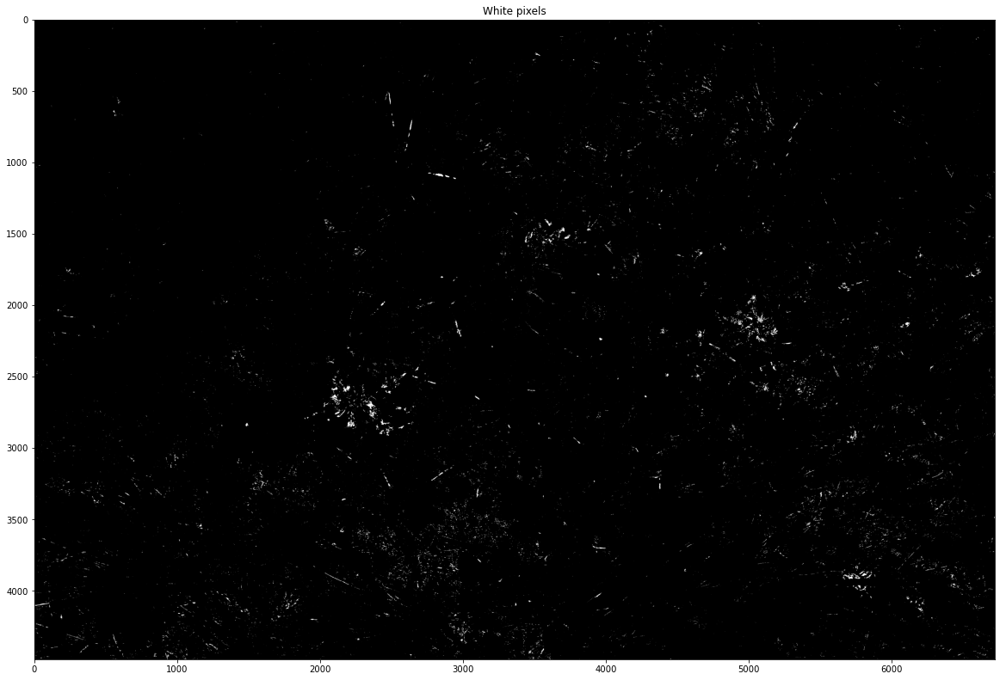

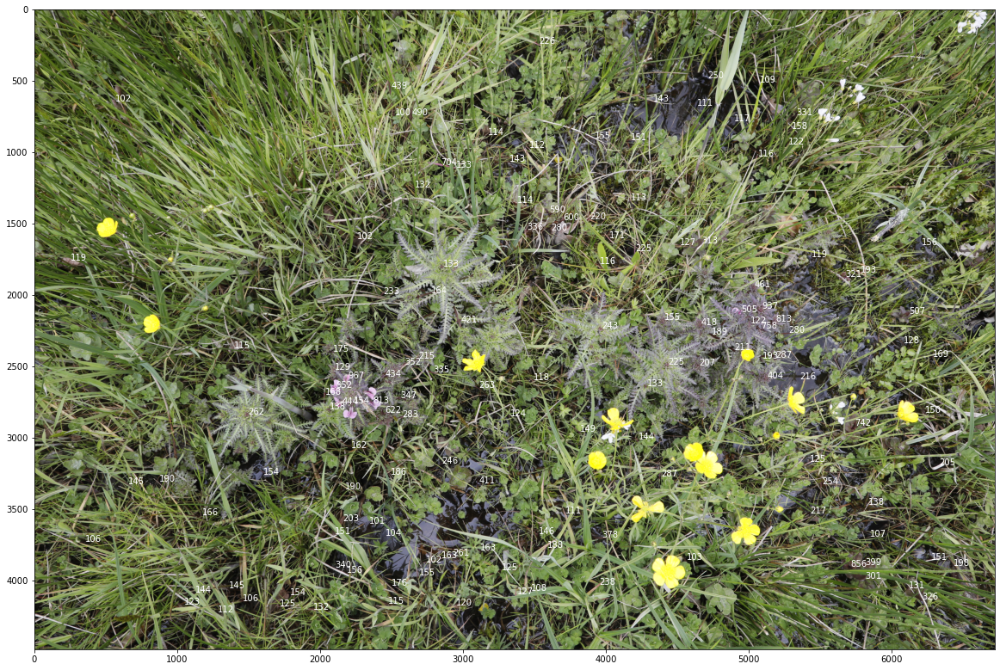

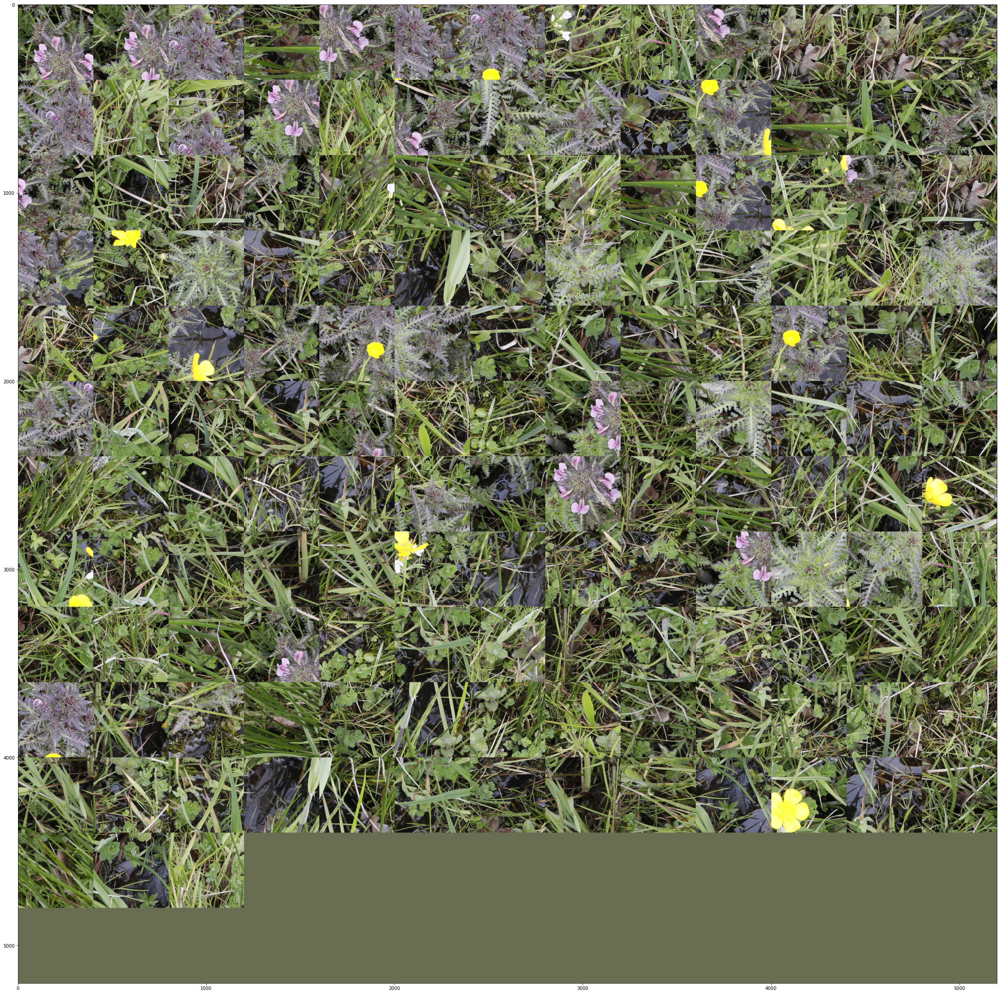

In [12]:
default_radius = 5
default_h = 200
default_minArea = 100
default_maxArea = 1000
default_mindist = 80

#Chose colors to detect
h_min = 115
s_min = 50
v_min = 0

h_max = 179
s_max = 115
v_max = 255

boba = Get_flower_data(path,
                       default_radius,
                       default_h,
                       default_minArea,
                       default_maxArea,
                       default_mindist,
                       h_min,s_min,v_min,
                       h_max,s_max,v_max)

In [13]:
def Download_data(boba,location,flower_name, file_type):
    
    yellowFlowerImagesArray = np.array(boba)
    allYellowFlowers = montage(yellowFlowerImagesArray, multichannel=True)
    
    filepath = location
    filepathYellow = os.path.join(filepath + '/Marsh Lousewort1')
    os.mkdir(filepathYellow)
    
    for i in range(len(yellowFlowerImagesArray)):
        filenameYellow = flower_name+'_'+str(i+1)+file_type
        filetowriteYellow = os.path.join(filepathYellow,filenameYellow)
        cv2.imwrite(filetowriteYellow,cv2.cvtColor(yellowFlowerImagesArray[i], cv2.COLOR_RGB2BGR))

In [14]:
path =  './Eindhoven_Flower_DataSet_2021/Marsh Lousewort'
file = 'Marsh Lousewort_B4A5292'
file_type = '.JPG'
Download_data(boba, path, file, file_type)